# 01. TPE Disk Tracking — StarDist

**Pipeline step 1 of 3** — detects photoelastic disks in each frame and links them into trajectories, then computes continuous rotation angles from UV images.

## Inputs
- Green-channel fluorescence images (`green_*.png`) — for disk detection
- UV/blue-channel images (`blue_*.png`) — for orientation tracking
- PE images (`bw_*.png`) — used for inspection only

## Outputs
- `<EXP_FOLDER>.pkl` — trajectory dataframe with columns:
  `frame, x, y, rpx, particle, boundary, angle`

## Workflow
1. Detect disks with StarDist2D → filter by area & eccentricity
2. Link detections into trajectories with Trackpy
3. Compute continuous rotation angles via PCA on UV images
4. Interpolate missing centroids or missing frame
5. Refine subpixel coordinates using convolution
6. Save trajectory to disk

### Imports

In [32]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import os
import sys
from skimage import measure
from csbdeep.utils import normalize
from stardist.models import StarDist2D
import gc
import tensorflow as tf
import trackpy as tp

sys.path.insert(0, os.getcwd())
import src

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Camera Calibration 


In [33]:
def camera_align(I):
    """Apply perspective correction (calibrated 20260518)."""
    H = np.array([[ 1.00705242e+00,  2.12358461e-02, -3.07876734e+00],
       [-1.92355106e-02,  1.01482353e+00, -3.99864701e+01],
       [-3.34090386e-06,  6.21694738e-07,  1.00000000e+00]])
    height, width = I.shape[:2]
    return cv2.warpPerspective(I, H, (width, height))

### Parameters — edit here before running

In [34]:
IMG_DIR    = r'E:'
EXP_FOLDER = r'TPE_20260526A_N=257x2_6SpeedSweep_strain=pi_5e2FramesEach'
PKL_DIR    = r'M:\Archive\Proj_TPE\Disk_traj_files'

roi = (250, 1200, 0, 2000)  # (y_min, y_max, x_min, x_max)

max_frame_bw   = int(src.max_num(IMG_DIR, EXP_FOLDER, 'bw_'))
max_frame_green = int(src.max_num(IMG_DIR, EXP_FOLDER, 'green_'))
max_frame_blue  = int(src.max_num(IMG_DIR, EXP_FOLDER, 'blue_'))
print(max_frame_bw, max_frame_green, max_frame_blue)
max_frame = max_frame_green

pickle_path = os.path.join(PKL_DIR, EXP_FOLDER)

print(f"Max frame:    {max_frame_bw}")

3000 3000 3000
Max frame:    3000


### Load models

In [35]:
MODEL_DIR = os.path.join(os.getcwd(), 'models')
model_name = "stardist_09221229"
model = StarDist2D(None, name=model_name, basedir=MODEL_DIR)

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.724202, nms_thresh=0.3.


### Load images and predict

In [ ]:
axis_norm = (0,1)   # normalize channels independentl

records = [] #empty list to store results temporarily

for frame in range(1, max_frame + 1):    
#for frame in [401]:
    # Load green images
    path = os.path.join(IMG_DIR, EXP_FOLDER, f'green_{frame:d}.png')
    I = cv2.imread(path)
    if I is None:
        print(f"skipping frame {frame} (file not found)")
        continue

    I = camera_align(cv2.flip(I, 1))
    
    sys.stdout.write(f"\rProcessing frame: {frame}")
    sys.stdout.flush()
    
    Ig = I[roi[0]:roi[1], roi[2]:roi[3], 1] #GREEN CHANNEL 
    input_image = normalize(Ig,1,99.8,axis=axis_norm)
    #PREDICT 
    mask, detail = model.predict_instances(input_image, n_tiles=model._guess_n_tiles(input_image), show_tile_progress=False)

    # Compute properties
    props = measure.regionprops(mask)

    # Create a list of dicts
    for region in props:
        y, x = region.centroid  # note: (row, col) = (y, x)
        records.append({
            "frame": frame,
            "x": x,
            "y": y,
            "area": region.area,
            "ecc": region.eccentricity
        })

    # Delete large variables explicitly
    del I, Ig, input_image, mask, detail, props
    
    # Clear memory periodically
    if frame % 100 == 0:
        gc.collect()
        tf.keras.backend.clear_session()

df = pd.DataFrame.from_records(records)

Processing frame: 100WARNING:tensorflow:From c:\Users\R332-GH-PC\anaconda3\envs\stardist_env\Lib\site-packages\keras\src\backend\common\global_state.py:82: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

Processing frame: 3000

### Filter Dataframe

In [37]:
df_filtered = df[(df["x"] < 1860)&(df["x"] > 100)&(df["y"] > 50)] #trim off boundary 
df_filtered = df_filtered[df_filtered["ecc"] < 0.6] #filter eccentricity #ecc filter changed to 0.6 20250923
df_filtered.loc[:,'rpx'] = 46 #add radius column
df_filtered.loc[df_filtered['area']<6000, 'rpx'] = 37


### Inspect detection in a random frame

Randomly selected frame: 2640


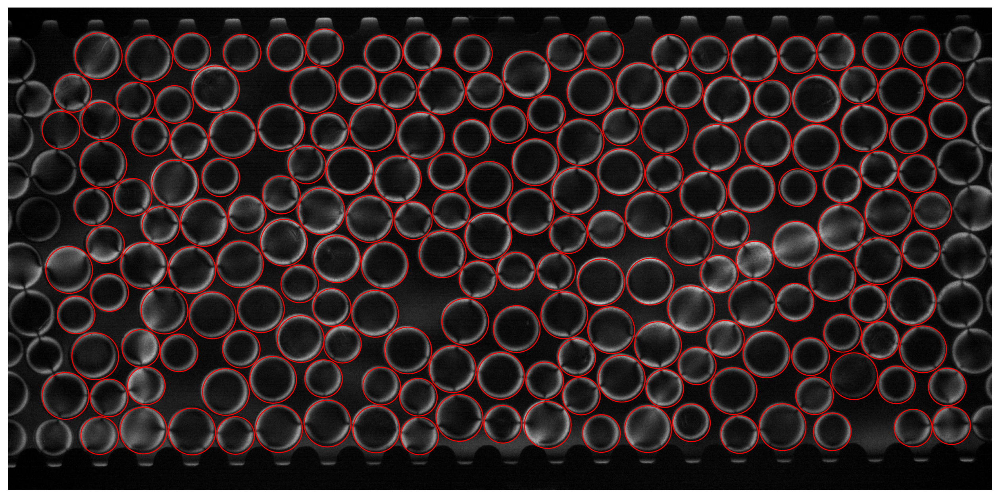

In [38]:
from matplotlib.patches import Circle

frame = np.random.choice(df_filtered['frame'].unique())
#frame = 747
print(f"Randomly selected frame: {frame}")

path_bw = os.path.join(IMG_DIR, EXP_FOLDER, f'bw_{frame}.png')
#path_green = os.path.join(IMG_DIR, EXP_FOLDER, f'blue_{frame}.png')
test_img = cv2.imread(path_bw)[roi[0]:roi[1], roi[2]:roi[3], 1]
#test_img = camera_align(cv2.flip(test_img, 1))[roi[0]:roi[1], roi[2]:roi[3], 1]  # Use green channel for display

fig, ax = plt.subplots(figsize=(16, 12))
ax.imshow(test_img, cmap = 'gray')  # Your raw image

for _, row in df_filtered[(df_filtered.frame == frame)].iterrows():
    circ = Circle((row["x"], row["y"]), row["rpx"], edgecolor='red', facecolor='none', linewidth=0.9)
    ax.add_patch(circ)

plt.axis('off')
plt.show()


### Link coordinates into trajectory

In [39]:
# Split df_filtered into 6 segments of 500 frames, link each separately,
# then recombine with offset particle IDs so identities never persist across boundaries.

N_SEGMENTS = 1
FRAMES_PER_SEG = 3000
ID_OFFSET = 1_000_000  # shift applied per segment to ensure unique particle IDs

frames_sorted = sorted(df_filtered['frame'].unique())
assert len(frames_sorted) == N_SEGMENTS * FRAMES_PER_SEG, \
    f"Expected {N_SEGMENTS * FRAMES_PER_SEG} frames, got {len(frames_sorted)}"

linked_segments = []
for seg_idx in range(N_SEGMENTS):
    seg_frames = frames_sorted[seg_idx * FRAMES_PER_SEG : (seg_idx + 1) * FRAMES_PER_SEG]
    df_seg = df_filtered[df_filtered['frame'].isin(seg_frames)].copy()

    linked_seg = tp.link(df_seg, search_range=30, memory=10)

    # Shift particle IDs so they are unique across segments
    linked_seg['particle'] = linked_seg['particle'] + seg_idx * ID_OFFSET

    linked_segments.append(linked_seg)
    print(f"Segment {seg_idx}: frames {seg_frames[0]}–{seg_frames[-1]}, "
          f"particles {linked_seg['particle'].nunique()}")

F_linked = pd.concat(linked_segments, ignore_index=True)
print(f"\nRecombined: {F_linked['frame'].nunique()} frames, {F_linked['particle'].nunique()} unique particle IDs")

# Mark boundary particles
F_linked['boundary'] = (F_linked.x < 200) | (F_linked.x > 1786) | (F_linked.y < 120) | (F_linked.y > 820)

# Change radius to mode value for each particle
F_linked['rpx'] = F_linked.groupby('particle')['rpx'].transform(lambda x: x.mode().iloc[0] if not x.mode().empty else x)


Frame 3000: 182 trajectories present.
Segment 0: frames 1–3000, particles 1293

Recombined: 3000 frames, 1293 unique particle IDs


### Find rotation angles

incorporated from TPE_rotation_angle_finder

In [40]:
records_rot = []

if 'dir_x' not in F_linked.columns:
    F_linked['dir_x'] = np.nan
if 'dir_y' not in F_linked.columns:
    F_linked['dir_y'] = np.nan

grouped_linked = F_linked.groupby('frame')

for frame in F_linked['frame'].unique():
    sys.stdout.write(f"\rProcessing frame: {frame}")
    sys.stdout.flush()

    if frame not in grouped_linked.groups:
        continue
    f = grouped_linked.get_group(frame)

    path = os.path.join(IMG_DIR, EXP_FOLDER, f'blue_{frame:d}.png')
    I = camera_align(cv2.flip(cv2.imread(path), 1))
    I = I[roi[0]:roi[1], roi[2]:roi[3], 0]  # BLUE CHANNEL

    records_rot.extend(src.compute_frame_orientations(f, I))

# Bulk-assign all rotation results in one shot
if records_rot:
    rot_df = pd.DataFrame(records_rot,
                          columns=['_idx', 'dir_x', 'dir_y', 'angle_R2']
                          ).set_index('_idx')
    F_linked.update(rot_df)

F_linked = src.compute_continuous_angles(F_linked)
F_linked = src.interpolate_pos_angle(F_linked)
F_linked.drop(['dir_x', 'dir_y'], axis=1, inplace=True)


Processing frame: 3000Interpolated 342 missing positions.


1332


(np.float64(-0.5), np.float64(1935.5), np.float64(949.5), np.float64(-0.5))

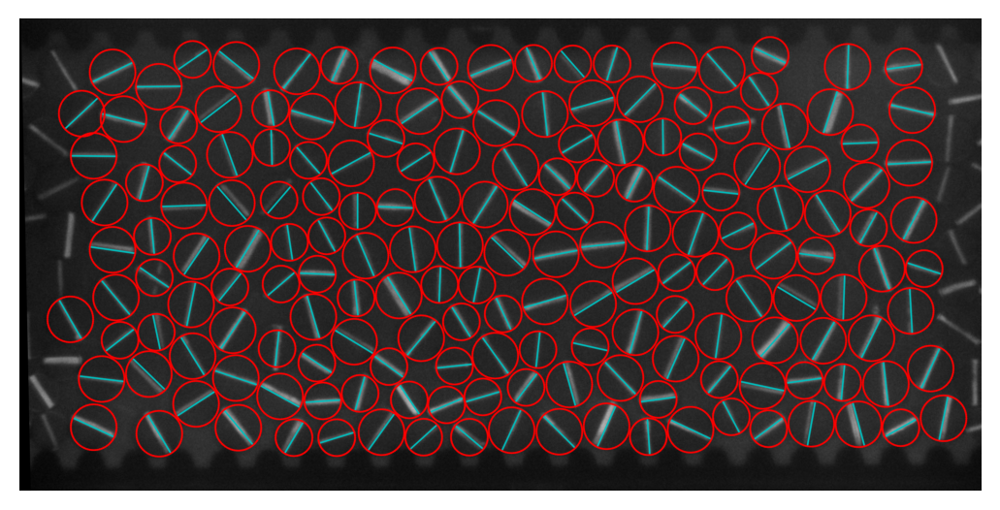

In [41]:
plt.rcParams['figure.dpi'] = 200

frame = np.random.choice(F_linked['frame'].unique())
print(frame)
path = os.path.join(IMG_DIR, EXP_FOLDER, f'blue_{frame:d}.png')
I = camera_align(cv2.flip(cv2.imread(path), 1))
I = I[roi[0]:roi[1], roi[2]:roi[3], 0] #BLUE CHANNEL 
if I.ndim == 2:  
    I = cv2.cvtColor(I, cv2.COLOR_GRAY2BGR)

res = src.draw_particle_orientation(I.copy(),F_linked[(F_linked.frame==frame)], show = False, linecolor='c', linewidth=2)
plt.imshow(res)
plt.axis('off')

### DoG Refinement of disk centers for improved tracking accuracy


In [42]:
print("Applying DoG refinement to disk centers...")

kernels = {
    46: src.dog_kernel(49, delta=3, sigma=2),
    37: src.dog_kernel(40, delta=3, sigma=2),
}

refined_data = []
max_frame_refine = int(F_linked['frame'].max())

for frame in range(1, max_frame_refine + 1):
    frame_data = F_linked[F_linked['frame'] == frame]

    path = os.path.join(IMG_DIR, EXP_FOLDER, f'green_{frame:d}.png')
    I_frame = cv2.imread(path)

    if I_frame is None:
        refined_data.extend(frame_data.itertuples(index=False, name=None))
        continue

    I_frame = camera_align(cv2.flip(I_frame, 1))
    refined_data.extend(src.refine_frame_centers(frame_data, I_frame, kernels, roi))

    if frame % max(1, max_frame_refine // 10) == 0:
        print(f"  Refined frame {frame}/{max_frame_refine}")

F_linked = pd.DataFrame(refined_data).reset_index(drop=True)
print(f"DoG refinement complete. Refined {len(F_linked)} detections.")


Applying DoG refinement to disk centers...
  Refined frame 300/3000
  Refined frame 600/3000
  Refined frame 900/3000
  Refined frame 1200/3000
  Refined frame 1500/3000
  Refined frame 1800/3000
  Refined frame 2100/3000
  Refined frame 2400/3000
  Refined frame 2700/3000
  Refined frame 3000/3000
DoG refinement complete. Refined 549489 detections.


Randomly selected frame: 401


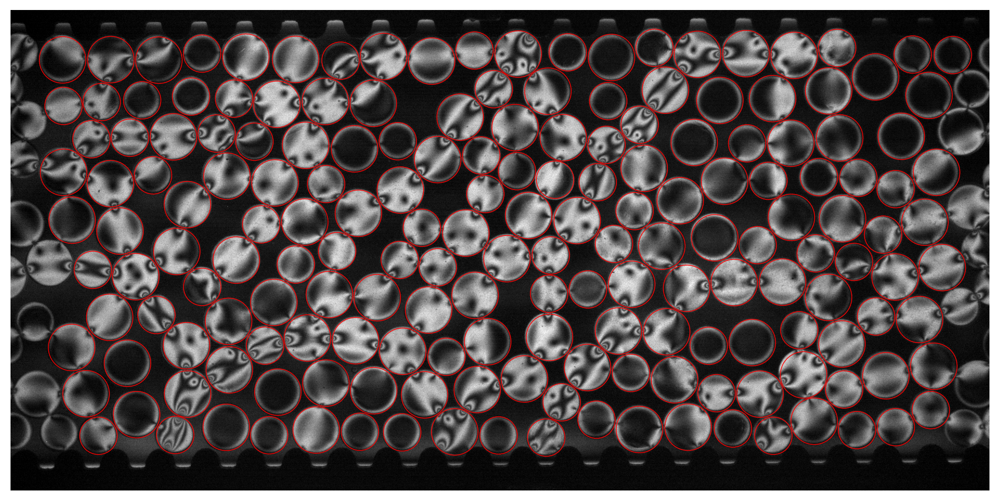

In [14]:
from matplotlib.patches import Circle

frame = np.random.choice(F_linked['frame'].unique())
print(f"Randomly selected frame: {frame}")

path_bw = os.path.join(IMG_DIR, EXP_FOLDER, f'bw_{frame}.png')
test_img = cv2.imread(path_bw)[roi[0]:roi[1], roi[2]:roi[3], 0]

fig, ax = plt.subplots(figsize=(12, 6))
ax.imshow(test_img, cmap = 'gray')  # Your raw image

for _, row in F_linked[(F_linked.frame == frame)].iterrows():
    circ = Circle((row["x"], row["y"]), row["rpx"], edgecolor='red', facecolor='none', linewidth=0.5)
    ax.add_patch(circ)

plt.axis('off')
plt.show()

### Compute per-particle G² 

In [43]:
# --- Per-particle G² computation ---
# Uses src.compute_G2_map, src.subtract_gaussian_rings, src.crop_circle_with_mask_float
print("Computing per-particle G²...")
sigma_frac = 0.1

for frame in sorted(F_linked['frame'].unique()):
    sys.stdout.write(f"\rFrame {frame}")
    sys.stdout.flush()

    image_path = os.path.join(IMG_DIR, EXP_FOLDER, f'bw_{frame}.png')
    img = cv2.imread(image_path)
    if img is None:
        print(f"\nWarning: could not load {image_path}, skipping.")
        continue

    img = img[roi[0]:roi[1], roi[2]:roi[3]]
    frame_data = F_linked[F_linked['frame'] == frame]

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 1).astype(np.float32)
    gray = gray / gray.max()
    gray = src.subtract_gaussian_rings(gray, frame_data, sigma_frac=sigma_frac)

    G2_map = src.compute_G2_map(gray)
    h, w = G2_map.shape

    for idx, row in frame_data.iterrows():
        x = int(np.around(float(row['x'])))
        y = int(np.around(float(row['y'])))
        r = int(row['rpx'])
        y1, y2 = max(0, y - r), min(h, y + r)
        x1, x2 = max(0, x - r), min(w, x + r)
        if (y2 - y1) == 0 or (x2 - x1) == 0:
            F_linked.at[idx, 'G2'] = np.nan
            continue
        G2_crop = src.crop_circle_with_mask_float(G2_map[y1:y2, x1:x2])
        F_linked.at[idx, 'G2'] = float(np.sum(G2_crop[G2_crop > 0]))

print("\nG² computation complete.")


Computing per-particle G²...
Frame 3000
G² computation complete.


Visualising G² for frame 437


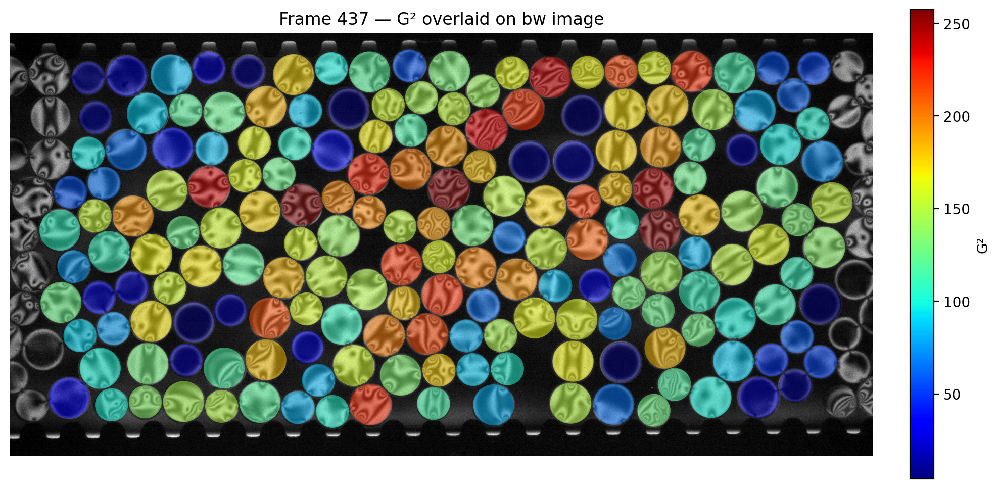

In [20]:
import matplotlib.patches as mpatches
from matplotlib import cm
from matplotlib.colors import Normalize

_frame = np.random.choice(F_linked['frame'].unique())
print(f"Visualising G² for frame {_frame}")

image_path = os.path.join(IMG_DIR, EXP_FOLDER, f'bw_{_frame}.png')
img_bgr  = cv2.imread(image_path)
img_crop = img_bgr[roi[0]:roi[1], roi[2]:roi[3]]
img_gray = cv2.cvtColor(img_crop, cv2.COLOR_BGR2GRAY)

frame_data = F_linked[F_linked['frame'] == _frame].copy()
f_vals = frame_data['G2'].to_numpy()
vmin = np.nanpercentile(f_vals, 1)
vmax = np.nanpercentile(f_vals, 99)
cmap = plt.colormaps['jet']
norm = Normalize(vmin=vmin, vmax=vmax)
sm   = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

fig, ax = plt.subplots(figsize=(10, 5))
ax.imshow(img_gray, cmap='gray', origin='upper')
ax.set_aspect('equal')

for _, row in frame_data.iterrows():
    fc   = cmap(norm(row.get('G2', np.nan)))
    circ = mpatches.Circle((float(row['x']), float(row['y'])), float(row['rpx']),
                           edgecolor='none', facecolor=fc, alpha=0.5, zorder=2)
    ax.add_patch(circ)

cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
cbar.set_label('G²')
ax.set_title(f'Frame {_frame} — G² overlaid on bw image') 
ax.axis('off')
plt.tight_layout()
plt.show()


### save to disk

In [44]:
F_linked.to_pickle(str(pickle_path+'.pkl'))

In [20]:
F_linked.loc[F_linked.frame<501, 'spd'] = 1e-3
F_linked.loc[(F_linked.frame>=501) & (F_linked.frame<1001), 'spd'] = 5e-4
F_linked.loc[(F_linked.frame>=1001) & (F_linked.frame<1501), 'spd'] = 2e-4
F_linked.loc[(F_linked.frame>=1501) & (F_linked.frame<2001), 'spd'] = 1e-4
F_linked.loc[(F_linked.frame>=2001) & (F_linked.frame<2501), 'spd'] = 5e-5
F_linked.loc[F_linked.frame>=2501, 'spd'] = 2e-5
F_linked.to_pickle(str(pickle_path+'.pkl'))


In [25]:
# Save 6 sub-dataframes to separate pickles with speed suffix
speed_ranges = [
    (F_linked[F_linked.frame<501], '1e-3'),
    (F_linked[(F_linked.frame>=501) & (F_linked.frame<1001)], '5e-4'),
    (F_linked[(F_linked.frame>=1001) & (F_linked.frame<1501)], '2e-4'),
    (F_linked[(F_linked.frame>=1501) & (F_linked.frame<2001)], '1e-4'),
    (F_linked[(F_linked.frame>=2001) & (F_linked.frame<2501)], '5e-5'),
    (F_linked[F_linked.frame>=2501], '2e-5'),
]

for df_sub, speed in speed_ranges:
    pkl_file = str(pickle_path + f'_spd_{speed}.pkl')
    df_sub.to_pickle(pkl_file)
    print(f"Saved {len(df_sub)} records to {pkl_file}")


Saved 93505 records to M:\Archive\Proj_TPE\Disk_traj_files\TPE_20260511A_N=262x2_6SpeedSweep_strain=0.5_5e2FramesEach_spd_1e-3.pkl
Saved 91750 records to M:\Archive\Proj_TPE\Disk_traj_files\TPE_20260511A_N=262x2_6SpeedSweep_strain=0.5_5e2FramesEach_spd_5e-4.pkl
Saved 93114 records to M:\Archive\Proj_TPE\Disk_traj_files\TPE_20260511A_N=262x2_6SpeedSweep_strain=0.5_5e2FramesEach_spd_2e-4.pkl
Saved 95698 records to M:\Archive\Proj_TPE\Disk_traj_files\TPE_20260511A_N=262x2_6SpeedSweep_strain=0.5_5e2FramesEach_spd_1e-4.pkl
Saved 95177 records to M:\Archive\Proj_TPE\Disk_traj_files\TPE_20260511A_N=262x2_6SpeedSweep_strain=0.5_5e2FramesEach_spd_5e-5.pkl
Saved 95731 records to M:\Archive\Proj_TPE\Disk_traj_files\TPE_20260511A_N=262x2_6SpeedSweep_strain=0.5_5e2FramesEach_spd_2e-5.pkl
